# Integration of scRNA-seq and spatial transcriptomics data with DiagVI

DiagVI is a multi-modal integration method that aligns unpaired datasets across different modalities. It produces a joint latent representation of cells, enables cross-modal imputation, and supports label transfer between modalities.
In this tutorial, we demonstrate how to use DiagVI to integrate dissociated scRNA-seq data with spatial transcriptomics data from mouse gastrulation embryos and compare against [scANVI](https://docs.scvi-tools.org/en/1.4.1/user_guide/models/scanvi.html) as well as a simple PCA baseline. In particular, we highlight DiagVI’s strength in integrating modalities with weak feature linkage, a setting where many existing methods struggle.

We use two publicly available datasets:
- Spatial transcriptomics (seqFISH) data from [Lohoff et al.](https://www.nature.com/articles/s41587-021-01006-2), consisting of sagittal sections from three mouse embryos collected between embryonic day E8.5 and E8.75. For this tutorial, we focus on a subset of the data comprising 57,536 cells from the E8.5 embryos.
- Dissociated scRNA-seq data from [Pijuan-Sala et al.](https://www.nature.com/articles/s41586-019-0933-9), profiling 166,312 cells between embryonic days E6.5 and E8.5, and providing a comprehensive reference atlas of early mouse development.

```{note}
Running the following cell will install tutorial dependencies on Google Colab and in the currently active environment when running outside of Google Colab.
```

In [1]:
!pip install --quiet scvi-colab
!pip install --quiet cellmapper
from scvi_colab import install

install()


[notice] A new release of pip is available: 24.3.1 -> 26.1.2
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 24.3.1 -> 26.1.2
[notice] To update, run: pip install --upgrade pip


/opt/anaconda3/envs/scvi_new/lib/python3.13/site-packages/scvi_colab/_core.py:42: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import ContextualVersionConflict
/opt/anaconda3/envs/scvi_new/lib/python3.13/site-packages/scvi_colab/_core.py:47: UserWarning: 
                Not currently in Google Colab environment.

                Please run with `run_outside_colab=True` to override.

                Returning with no further action.
                
  warn(


## Imports and data loading

In [2]:
import os
import tempfile
import warnings

import matplotlib.pyplot as plt
import numpy as np
import scanpy as sc
import scvi
import seaborn as sns
import torch
from cellmapper import CellMapper
from scib_metrics.benchmark import Benchmarker
from scvi.external import DIAGVI

In [3]:
warnings.filterwarnings("ignore")
scvi.settings.seed = 0
print("Last run with scvi-tools version:", scvi.__version__)

Seed set to 0


Last run with scvi-tools version: 1.4.3


```{note}
You can modify `save_dir` below to change where the data files for this tutorial are saved.
```

In [4]:
sc.set_figure_params(figsize=(6, 6), frameon=False)
sns.set_theme()
torch.set_float32_matmul_precision("high")
save_dir = tempfile.TemporaryDirectory()

%config InlineBackend.print_figure_kwargs={"facecolor": "w"}
%config InlineBackend.figure_format="retina"

### Data Acquisition 

In [5]:
adata_rna_path = os.path.join(save_dir.name, "ad_diss.h5ad")
ad_diss = sc.read(
    adata_rna_path, backup_url="https://exampledata.scverse.org/scvi-tools/dissociated.h5ad"
)
ad_diss

  0%|          | 0.00/124M [00:00<?, ?B/s]

AnnData object with n_obs × n_vars = 16496 × 18499
    obs: 'barcode', 'sample_rna', 'stage', 'sequencing.batch', 'theiler', 'doub.density', 'doublet', 'cluster', 'cluster.sub', 'cluster.stage', 'cluster.theiler', 'stripped', 'celltype_rna', 'haem_subclust', 'endo_trajectoryName', 'endo_trajectoryDPT', 'endo_gutDPT', 'endo_gutCluster', 'sizefactor', 'modality', 'total_counts', 'n_counts', 'celltype_harmonized'
    var: 'gene_ids', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltype_harmonized_colors', 'celltype_rna_colors', 'cluster_colors', 'hvg', 'pca', 'sample_colors', 'sequencing.batch_colors', 'stage_colors', 'theiler_colors', 'umap'
    obsm: 'X_endo_gephi', 'X_endo_gut', 'X_haem_gephi', 'X_pca', 'X_umap', 'X_umap_orig'
    varm: 'PCs'

In [6]:
adata_protein_path = os.path.join(save_dir.name, "ad_sp.h5ad")
ad_sp = sc.read(
    adata_protein_path, backup_url="https://exampledata.scverse.org/scvi-tools/spatial.h5ad"
)
ad_sp

  0%|          | 0.00/22.0M [00:00<?, ?B/s]

AnnData object with n_obs × n_vars = 51787 × 351
    obs: 'embryo', 'pos', 'z', 'embryo_pos', 'embryo_pos_z', 'Area', 'celltype_seqfish', 'sample_seqfish', 'umap_density_sample', 'modality', 'total_counts', 'n_counts', 'celltype_harmonized'
    uns: 'celltype_harmonized_colors', 'celltype_seqfish_colors', 'embryo_colors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap', 'X_umap_orig', 'spatial'
    varm: 'PCs'

### Data Preprocessing
We begin by preprocessing the raw datasets. This workflow follows the steps described in the [preprocessing tutorial](https://docs.scvi-tools.org/en/stable/tutorials/notebooks/use_cases/preprocessing.html#multiome).

In [7]:
# Preprocess spatial data
ad_sp.layers["counts"] = ad_sp.X.copy()
ad_sp.var["original_feature_name"] = ad_sp.var.index.copy()

sc.pp.normalize_total(ad_sp, target_sum=1e4)
sc.pp.log1p(ad_sp)

In [8]:
# Preprocess dissociated data
ad_diss.layers["counts"] = ad_diss.X.copy()
ad_diss.var["original_feature_name"] = ad_diss.var.index.copy()

sc.pp.normalize_total(ad_diss, target_sum=1e4)
sc.pp.log1p(ad_diss)
sc.pp.highly_variable_genes(ad_diss)

print(f"Computed {ad_diss.var['highly_variable'].sum()} highly variable genes")

Computed 1677 highly variable genes


We subset the dissociated data to the union of highly variable genes and spatially measured genes. This ensures the model can learn from the full set of informative genes.

In [9]:
genes_diss = ad_sp.var_names.union(ad_diss.var.query("highly_variable").index).intersection(
    ad_diss.var_names
)
ad_diss = ad_diss[:, genes_diss].copy()

print(f"Spatial data dimensions: {ad_sp.shape}")
print(f"Dissociated data dimensions: {ad_diss.shape}")

Spatial data dimensions: (51787, 351)
Dissociated data dimensions: (16496, 1780)


### Data Visualization

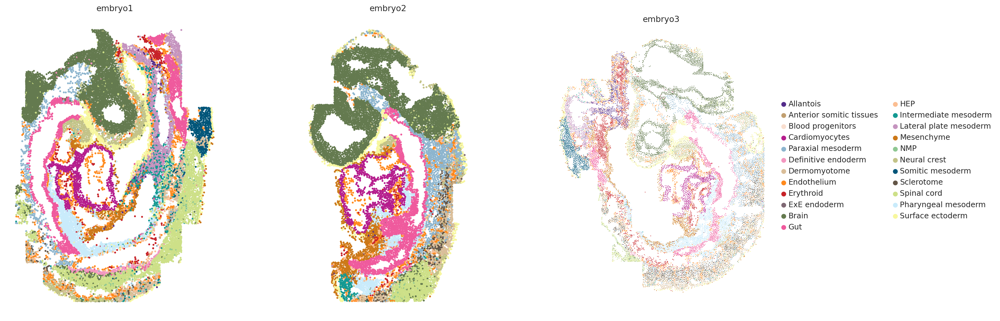

In [10]:
# Visualize spatial data for the three embryos side-by-side
fig, axes = plt.subplots(1, 3, figsize=(20, 8))

with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=FutureWarning)
    for idx, embryo in enumerate(["embryo1", "embryo2", "embryo3"]):
        sc.pl.spatial(
            ad_sp[ad_sp.obs["embryo"] == embryo],
            color="celltype_harmonized",
            spot_size=1.5,
            show=False,
            ax=axes[idx],
            title=embryo,
            legend_loc="right margin" if idx == 2 else None,
        )

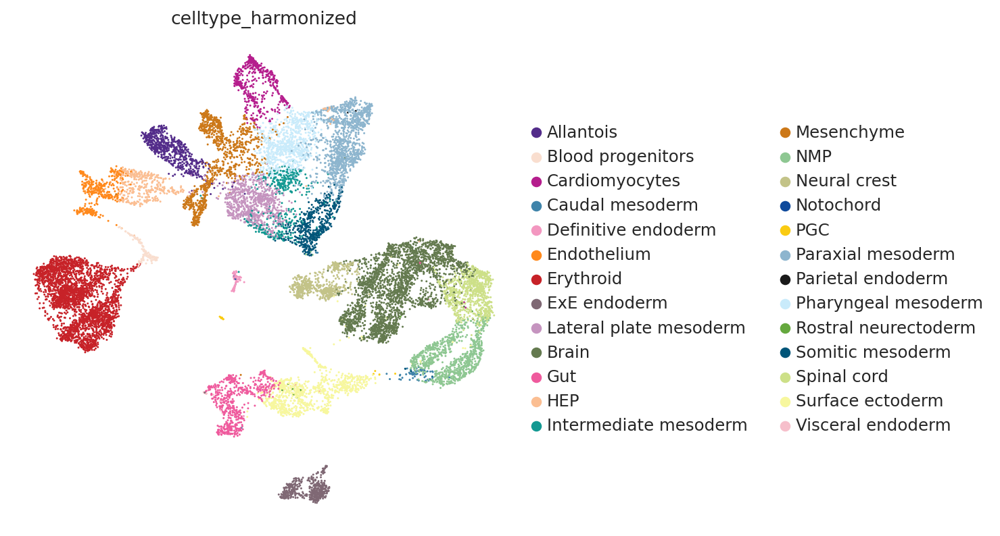

In [11]:
# Visualize scRNA-seq data UMAP
sc.pl.embedding(ad_diss, basis="X_umap", color="celltype_harmonized")

## Prepare and run DiagVI

### Setup AnnData objects

We register each AnnData object with DiagVI using `setup_anndata`. To run a (semi-)supervised model, a `label_key` can be specified for each AnnData object separately.

In this tutorial, we model a common scenario in single cell analysis: Integration of an unannotated spatial transcriptomics dataset in an annotated scRNA-seq reference atlas. Therefore, we provide the `label_key` only for the scRNA-seq modality. 

Furthermore, we enable a Gaussian mixture prior for both modalities with `gmm_prior=True`. 
For the unannotated spatial transcriptomics dataset, we set `n_mixture_components=29` to match the number of cell types in the annotated scRNA-seq reference.

```{important}
Key parameters for `setup_anndata`:

- `layer`: Specifies which layer contains raw counts for model input (e.g., `"counts"`)
- `batch_key`: Column in `.obs` containing batch information to correct for
- `labels_key`: Column in `.obs` containing cell type labels (optional). When provided, labels inform the latent space structure
- `likelihood`: Likelihood function used to model gene expression counts. Supported options include:  
  - `"nb"`: Negative binomial (default; recommended for count data)  
  - `"zinb"`: Zero-inflated negative binomial  
- `gmm_prior`: If `True`, uses a Gaussian mixture model (GMM) prior on the latent space
- `n_mixture_components`: Number of GMM components. Only required when `labels_key` is not provided; otherwise, the number of unique labels is used automatically

Additional configuration options are available. For (spatial) transcriptomics data, we recommend using either `"nb"` or `"zinb"`.
```

In [12]:
DIAGVI.setup_anndata(
    ad_diss,
    layer="counts",
    batch_key="sample_rna",
    labels_key="celltype_harmonized",
    likelihood="nb",
    gmm_prior=True,
)

DIAGVI.setup_anndata(
    ad_sp,
    layer="counts",
    batch_key="embryo",
    likelihood="nb",
    gmm_prior=True,
    n_mixture_components=29,
)

Next, we create the DiagVI model object by providing a dictionary that maps modality names (chosen by the user) to their corresponding AnnData objects.

Since the scRNA-seq and spatial transcriptomics datasets share gene symbols, DiagVI can automatically construct the guidance graph during model initialization. For more details on alternative ways to define the guidance graph, refer to the [DiagVI user guide](https://docs.scvi-tools.org/en/stable/).

In [13]:
input_dict = {"scRNAseq": ad_diss, "seqFISH": ad_sp}
model = DIAGVI(adatas=input_dict)

INFO     Guidance graph consistency checks passed.                                                                 
INFO     DiagVI Model with the following params: input names: ['scRNAseq', 'seqFISH'], n_inputs: {'scRNAseq': 1780,
         'seqFISH': 351}, n_batches: {'scRNAseq': 4, 'seqFISH': 3}, n_labels: {'scRNAseq': 27, 'seqFISH': 1},      
         semi_supervised: {'scRNAseq': True, 'seqFISH': False}, gmm_priors: {'scRNAseq': True, 'seqFISH': True},   
         generative distributions: {'scRNAseq': 'nb', 'seqFISH': 'nb'}, n_latent: 50.                              


In [14]:
model

DiagVI Model with the following params: input names: ['scRNAseq', 'seqFISH'], n_inputs: {'scRNAseq': 1780, 
'seqFISH': 351}, n_batches: {'scRNAseq': 4, 'seqFISH': 3}, n_labels: {'scRNAseq': 27, 'seqFISH': 1}, 
semi_supervised: {'scRNAseq': True, 'seqFISH': False}, gmm_priors: {'scRNAseq': True, 'seqFISH': True}, generative 
distributions: {'scRNAseq': 'nb', 'seqFISH': 'nb'}, n_latent: 50.
Training status: Not Trained

### Train the model
DiagVI's training objective combines several loss components, which can be weighted via `lam_*` parameters in `plan_kwargs`. Most parameters have defaults that work well across datasets and modalities, but two parameters need to be adapted depending on the setting.

```{note}
Key training parameters:
- `lam_class`: Weight for the classification loss. Higher values enforce stronger separation between labeled cell types in the latent space.
- `lam_sinkhorn`: Weight for the unbalanced optimal transport (Sinkhorn) loss, which aligns cell distributions across modalities. Higher values promote stronger modality mixing but may reduce cell type separation.
```

For this use case — similar modalities with many cell types — we use a lower `lam_sinkhorn` and higher `lam_class` than the defaults. This prioritizes cell type separation over strong modality mixing. For guidance on tuning these parameters for different integration scenarios, refer to the [DiagVI user guide](https://docs.scvi-tools.org/en/stable/).

In [15]:
model.train(
    plan_kwargs={
        "lam_sinkhorn": 5,
        "lam_class": 70,
    }
)

INFO     max_epochs was approximated to 400                                                                        


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/400 [00:00<?, ?it/s]

Monitored metric validation_loss did not improve in the last 10 records. Best score: 300.334. Signaling Trainer to stop.


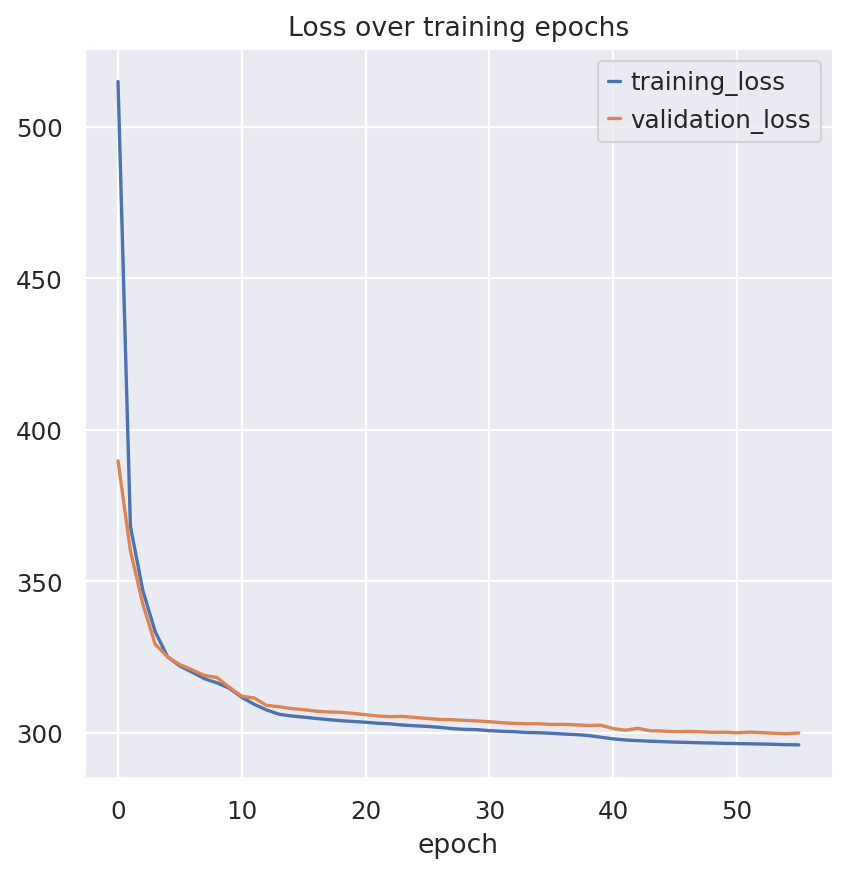

In [16]:
fig, ax = plt.subplots(1, 1)
model.history["training_loss"].plot(ax=ax, label="train")
model.history["validation_loss"].plot(ax=ax, label="validation")
ax.set(title="Loss over training epochs")
ax.legend()

## Analyze outputs
### Visualize the latent space

First, we retrieve the latent representations for both modalities. These are concatenated to a combined object to compute a joint UMAP embedding.

In [17]:
DIAGVI_LATENT_KEY = "X_diagvi"

latents = model.get_latent_representation()
ad_diss.obsm[DIAGVI_LATENT_KEY] = latents["scRNAseq"]
ad_sp.obsm[DIAGVI_LATENT_KEY] = latents["seqFISH"]

combined = sc.concat([ad_diss, ad_sp], axis=0, join="inner")

In [18]:
# Preserve cell type colors from both datasets
color_lookup = dict(
    zip(
        ad_diss.obs["celltype_harmonized"].cat.categories,
        ad_diss.uns["celltype_harmonized_colors"],
        strict=False,
    )
) | dict(
    zip(
        ad_sp.obs["celltype_harmonized"].cat.categories,
        ad_sp.uns["celltype_harmonized_colors"],
        strict=False,
    )
)
combined.uns["celltype_harmonized_colors"] = [
    color_lookup[c] for c in combined.obs["celltype_harmonized"].cat.categories
]

Then we use the DiagVI latent space, to recalculate and plot the joint embedding.

In [23]:
PCA_LATENT_KEY = "X_joint_pca"
DIAGVI_UMAP_KEY = "X_umap_diagvi"
import rapids_singlecell as rsc

rsc.tl.pca(combined, key_added=PCA_LATENT_KEY)

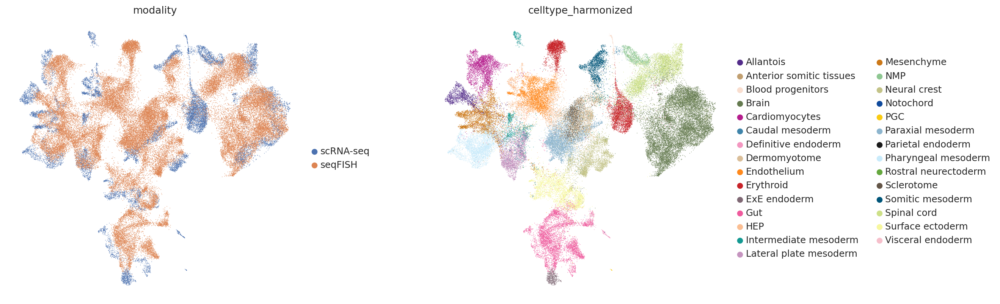

In [24]:
rsc.pp.neighbors(combined, use_rep=DIAGVI_LATENT_KEY, metric="cosine")
rsc.tl.umap(combined, key_added=DIAGVI_UMAP_KEY)
sc.pl.embedding(
    combined,
    basis="umap_diagvi",
    color=["modality", "celltype_harmonized"],
    wspace=0.3,
    ncols=2,
)

The UMAP visualization shows that cell types are well separated in the joint latent space, while the two modalities show partial but not complete overlap. To increase modality mixing, `lam_sinkhorn` can be increased — though this may reduce separation between cell types.

### Impute missing features
A key application of DiagVI is imputing expression values for features that were measured in only one of the modalities.

Since spatial transcriptomics technologies like seqFISH only measure a limited panel of genes, DiagVI can leverage the learned cross-modal mapping to predict expression of all genes profiled in the scRNA-seq reference for each spatial cell. We use the `get_imputed_values` method to obtain these predictions.

In [25]:
imputed_values = model.get_imputed_values(query_name="seqFISH", query_adata=ad_sp)

To evaluate imputation quality, we use [CellMapper](https://cellmapper.readthedocs.io/), a toolkit for cross-modal cell mapping and evaluation. Here, we leverage CellMapper's evaluation functionality to compute Pearson correlations between the true expression value and the DiagVI-imputed values for genes present in both modalities.

In [26]:
# initialize CellMapper and assign imputed values for feature imputation evaluation
cmap = CellMapper(query=ad_sp, reference=ad_diss)
cmap.query_imputed = imputed_values

INFO     Initialized CellMapper with 51787 query cells and 16496 reference cells.                                  
INFO     Imputed expression matrix with shape (51787, 1780) converted to AnnData object.                           
         Observation metadata from query and feature metadata from reference were linked (not copied).             


In [27]:
# evaluate feature imputation performance
cmap.evaluate_expression_transfer(layer_key="counts", groupby="embryo")

INFO     Expression transfer evaluation (pearson): average value = 0.5133 (n_shared_genes=350, n_test_genes=350)   
INFO     Metrics per group defined in `query.obs['embryo']` computed and stored in `query.varm['metric_pearson']`  


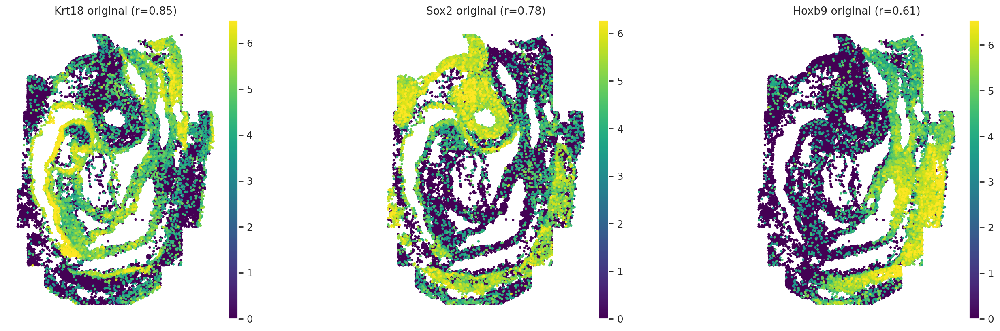

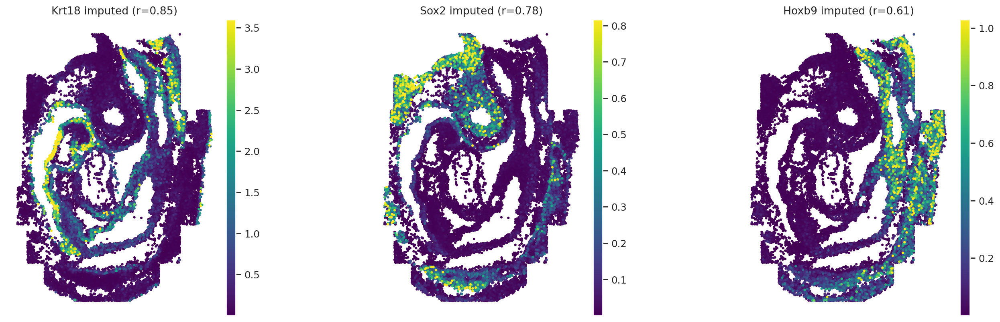

In [28]:
# Visualization original and imputed expression values for three genes in embryo1
obs_mask = ad_sp.obs["embryo"] == "embryo1"
gene_names = ["Krt18", "Sox2", "Hoxb9"]
gene_corrs = ad_sp.var.loc[gene_names]["metric_pearson"].values

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    for adata, key in zip(
        [ad_sp[obs_mask], cmap.query_imputed[obs_mask]],
        ["original", "imputed"],
        strict=False,
    ):
        sc.pl.spatial(
            adata,
            spot_size=1,
            color=gene_names,
            title=[
                f"{name} {key} (r={corr:.2f})"
                for name, corr in zip(gene_names, gene_corrs, strict=False)
            ],
            ncols=len(gene_names),
            size=2,
            cmap="viridis",
            vmax="p99",
        )

### Transfer cell type labels

Another key application is transferring cell type annotations from an annotated reference to unannotated or partially annotated query data. 
Here, we treat the spatial dataset as unlabeled and transfer cell type annotations from the scRNA-seq reference using the DiagVI latent space.
We use [CellMapper](https://cellmapper.readthedocs.io/) to perform k-nearest neighbor (KNN)–based mapping and to compute prediction confidence scores for each transferred label.

In [29]:
# set up CellMapper for label transfer and evaluation
cmap = CellMapper(query=ad_sp, reference=ad_diss)
cmap.map("celltype_harmonized", use_rep=DIAGVI_LATENT_KEY)

INFO     Initialized CellMapper with 51787 query cells and 16496 reference cells.                                  
WARNING  Using sklearn for neighbor search with large dataset (16496 cells). Consider using approximate k-NN search
         (e.g. pynndescent) or GPU acceleration (e.g. faiss or rapids)                                             
INFO     Using sklearn to compute 30 neighbors.                                                                    
INFO     Computing mapping matrix using kernel method 'gauss'.                                                     
INFO     Mapping categorical data for key 'celltype_harmonized' using direct multiplication.                       
INFO     Categorical data mapped and stored in query.obs['celltype_harmonized_pred'].                              


CellMapper(query=AnnData(n_obs=51,787, n_vars=351), reference=AnnData(n_obs=16,496, n_vars=1,780)

In [30]:
# evaluate label transfer performance
cmap.evaluate_label_transfer(label_key="celltype_harmonized")

INFO     Accuracy: 0.6491, Precision: 0.7226, Recall: 0.6491, Weighted F1-Score: 0.6491, Macro F1-Score: 0.4206,   
         Excluded Fraction: 0.0000                                                                                 


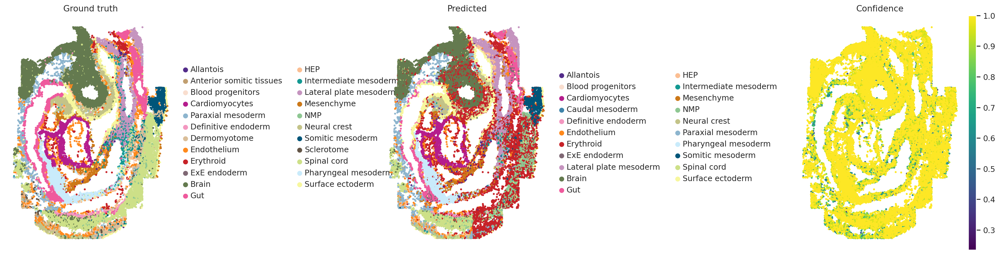

In [31]:
# Visualization of original/transferred labels and confidence scores for embryo1
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.spatial(
        ad_sp[ad_sp.obs["embryo"] == "embryo1"],
        spot_size=1,
        color=["celltype_harmonized", "celltype_harmonized_pred", "celltype_harmonized_conf"],
        title=["Ground truth", "Predicted", "Confidence"],
        ncols=3,
        size=2,
        cmap="viridis",
        wspace=0.4,
    )

Another way to perform label transfer is to use the cell type classifier that is trained if cell type labels are provided (in our scenario, for the dissociated modality).

In [32]:
classifier_predictions = model.predict_celltype(labeled_modality="scRNAseq")
ad_sp.obs["celltype_harmonized_pred"] = classifier_predictions["predictions"]
ad_sp.obs["celltype_harmonized_conf"] = classifier_predictions["confidence"]

In [33]:
cmap = CellMapper(query=ad_sp, reference=ad_sp)
cmap.evaluate_label_transfer(
    label_key="celltype_harmonized", prediction_postfix="_pred", confidence_postfix="_conf"
)

WARNING  The same AnnData object was passed as both query and reference. Initializing in self-mapping mode.        
INFO     Initialized CellMapper for self-mapping with 51787 cells.                                                 
INFO     Accuracy: 0.6444, Precision: 0.7060, Recall: 0.6444, Weighted F1-Score: 0.6426, Macro F1-Score: 0.4675,   
         Excluded Fraction: 0.0000                                                                                 


The performance is comparable to the label transfer implemented with CellMapper, while offering the advantage of not requiring any additional dependencies.

### Integration Benchmarking
Finally, we compare the DiagVI latent space against a simple baseline (PCA computed on the concatenated datasets). Furthermore, we compare with scVI and scANVI trained on the combined object.

We start by setting up the scVI and scANVI models. As with DiagVI, we provide labels only for the dissociated modality. Furthermore, we provide batch information.

In [34]:
# prepare cell type label and batch information
combined.obs["celltype_scvi"] = np.concatenate(
    [ad_diss.obs["celltype_harmonized"].astype(str).values, np.repeat("unknown", ad_sp.shape[0])]
)
combined.obs["batch"] = np.concatenate(
    [ad_diss.obs["sample_rna"].astype(str).values, ad_sp.obs["embryo"].astype(str).values]
)

In [35]:
SCVI_LATENT_KEY = "X_scVI"
SCANVI_LATENT_KEY = "X_scANVI"

# train a scVI model on the combined dataset
scvi.model.SCVI.setup_anndata(combined, layer="counts", batch_key="batch")
scvi_model = scvi.model.SCVI(combined)
scvi_model.train()

# assign scVI latent representation to combined AnnData
combined.obsm[SCVI_LATENT_KEY] = scvi_model.get_latent_representation()

scanvi_model = scvi.model.SCANVI.from_scvi_model(
    scvi_model,
    adata=combined,
    labels_key="celltype_scvi",
    unlabeled_category="unknown",
)
scanvi_model.train(max_epochs=100, check_val_every_n_epoch=1)

# assign scANVI latent representation to combined AnnData
combined.obsm[SCANVI_LATENT_KEY] = scanvi_model.get_latent_representation()

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/117 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=117` reached.


INFO     Training for 100 epochs.                                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/100 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=100` reached.


To qualitative compyrison, we visualize the latent representations of the shared PCA space, scVI, scANVI and DiagVI side by side. 

In [37]:
embedding_keys = {
    "Joint PCA": (PCA_LATENT_KEY, "X_umap_joint_pca"),
    "scVI": (SCVI_LATENT_KEY, "X_umap_scvi"),
    "scANVI": (SCANVI_LATENT_KEY, "X_umap_scanvi"),
    "DiagVI": (DIAGVI_LATENT_KEY, "X_umap_diagvi"),
}

for _, (latent_key, umap_key) in embedding_keys.items():
    rsc.pp.neighbors(combined, use_rep=latent_key, metric="cosine")
    rsc.tl.umap(combined, key_added=umap_key)

... storing 'celltype_scvi' as categorical
... storing 'batch' as categorical


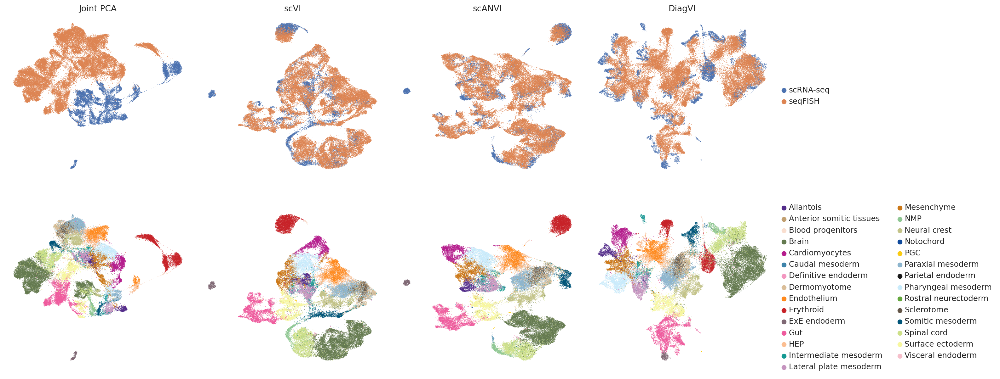

In [38]:
colors = ["modality", "celltype_harmonized"]
n_methods = len(embedding_keys)
n_colors = len(colors)

fig, axes = plt.subplots(n_colors, n_methods, figsize=(5 * n_methods, 4 * n_colors))
method_names = list(embedding_keys.keys())

for col, (method_name, (_, umap_key)) in enumerate(embedding_keys.items()):
    for row, color in enumerate(colors):
        ax = axes[row, col]

        legend_loc = "right margin" if col == n_methods - 1 else None

        sc.pl.embedding(
            combined,
            basis=umap_key,
            color=color,
            ax=ax,
            show=False,
            title=method_name if row == 0 else "",
            legend_loc=legend_loc,
        )

plt.tight_layout()
plt.show()

In the scVI embedding, the two modalities do not overlap at all. In contrast, scVI appears to slightly overintegrate the data, leading to some overlap between cell types. The embeddings produced by scANVI and DiagVI, look quite similar.

For quantitative comparison, we use the [scib-metrics](https://scib-metrics.readthedocs.io/en/stable/) package, which implements a standardized collection of metrics for evaluating integration performance and biological signal preservation in latent representations.

In [43]:
from scvi.external import cytovi

combined.obs_names_make_unique()
combined_sub = cytovi.subsample(combined, n_obs=10000, groupby="modality")

In [44]:
bm = Benchmarker(
    combined_sub,
    batch_key="batch",
    label_key="celltype_harmonized",
    embedding_obsm_keys=[PCA_LATENT_KEY, DIAGVI_LATENT_KEY, SCVI_LATENT_KEY, SCANVI_LATENT_KEY],
    progress_bar=False,
    n_jobs=-1,
)
bm.benchmark()

2026-06-18 14:43:18 | [INFO] isolated labels: no more than 2 batches per label
INFO:2026-06-18 14:43:18,784:jax._src.xla_bridge:834: Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory
2026-06-18 14:43:18 | [INFO] Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory
E0618 14:45:19.304328 2473597 slow_operation_alarm.cc:73] 
********************************
[Compiling module input_reduce_fusion for GPU] Very slow compile? If you want to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
********************************
E0618 14:51:21.883285 2473589 slow_operation_alarm.cc:140] The operation took 8m2.579032739s

********************************
[Compiling module input_reduce_fusion for GPU] Very slow compile? If you want to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/

INFO     PGC consists of a single batch or is too small. Skip.                                                     
INFO     Rostral neurectoderm consists of a single batch or is too small. Skip.                                    
INFO     Visceral endoderm consists of a single batch or is too small. Skip.                                       


2026-06-18 14:52:38 | [INFO] isolated labels: no more than 2 batches per label


INFO     PGC consists of a single batch or is too small. Skip.                                                     
INFO     Rostral neurectoderm consists of a single batch or is too small. Skip.                                    
INFO     Visceral endoderm consists of a single batch or is too small. Skip.                                       


2026-06-18 14:52:55 | [INFO] isolated labels: no more than 2 batches per label


INFO     PGC consists of a single batch or is too small. Skip.                                                     
INFO     Rostral neurectoderm consists of a single batch or is too small. Skip.                                    
INFO     Visceral endoderm consists of a single batch or is too small. Skip.                                       


2026-06-18 14:53:37 | [INFO] isolated labels: no more than 2 batches per label


INFO     PGC consists of a single batch or is too small. Skip.                                                     
INFO     Rostral neurectoderm consists of a single batch or is too small. Skip.                                    
INFO     Visceral endoderm consists of a single batch or is too small. Skip.                                       


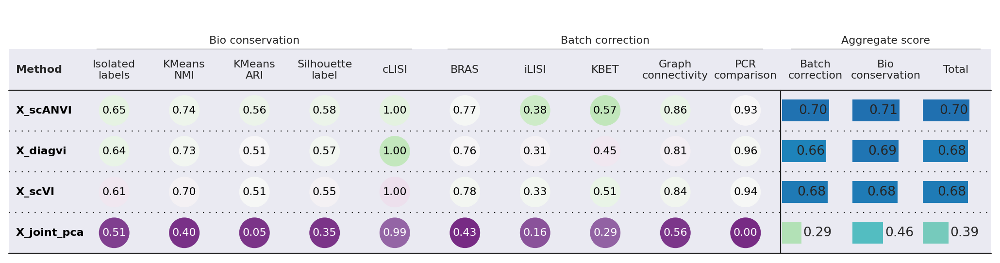

In [45]:
bm.plot_results_table(min_max_scale=False)

ScANVI slightly outperforms DiagVI on this integration task. This result is expected given the characteristics of this particular dataset:

- **Similar modalities**: Both scRNA-seq and seqFISH measure gene expression, making this more of a batch integration problem than a true cross-modal challenge. Methods like scVI/scANVI are specifically optimized for this setting.
- **Strong feature linkage**: With ~350 shared genes between modalities, there is substantial overlap for alignment. DiagVI is designed to excel in weak-linkage scenarios where only a small number of features (or none at all) are shared across modalities.
- **Dense feature overlap favors concatenation-based methods**: When modalities share many features, simply concatenating the data and applying a single-modality method (like scANVI) can be highly effective. DiagVI's guidance graph and optimal transport components provide the most benefit when feature correspondence is sparse.

## Re-do the analysis using a subset of the linked features

To demonstrate DiagVI's strength in the weak-linkage regime, we repeat the integration and benchmark using only 50 of the ~350 shared genes. This simulates a scenario where feature correspondence between modalities is sparse — the setting DiagVI is designed for. All training parameters remain unchanged.

In [ ]:
# Subset to 50 linked features (HVG in the spatial modality)
# keep genes present in both modalities + HVGs
sc.pp.highly_variable_genes(ad_sp, n_top_genes=50, flavor="seurat_v3")
linked_genes = ad_sp[:, ad_sp.var["highly_variable"]].var_names
ad_diss_sub = ad_diss[
    :, ad_diss.var_names.isin(linked_genes) | ad_diss.var["highly_variable"]
].copy()
ad_sp_sub = ad_sp[:, ad_sp.var_names.isin(linked_genes)].copy()

# Setup and train DiagVI with reduced linkage (50 features)
DIAGVI.setup_anndata(
    ad_diss_sub,
    layer="counts",
    batch_key="sample_rna",
    labels_key="celltype_harmonized",
    likelihood="nb",
    gmm_prior=True,
)
DIAGVI.setup_anndata(
    ad_sp_sub,
    layer="counts",
    batch_key="embryo",
    likelihood="nb",
    gmm_prior=True,
    n_mixture_components=29,
)
model_sub = DIAGVI(adatas={"scRNAseq": ad_diss_sub, "seqFISH": ad_sp_sub})
model_sub.train(
    plan_kwargs={
        "lam_sinkhorn": 5,
        "lam_class": 70,
    }
)

In [ ]:
# Get latent representations and create combined object
latents_sub = model_sub.get_latent_representation()
ad_diss_sub.obsm[DIAGVI_LATENT_KEY], ad_sp_sub.obsm[DIAGVI_LATENT_KEY] = (
    latents_sub["scRNAseq"],
    latents_sub["seqFISH"],
)
combined_sub = sc.concat([ad_diss_sub, ad_sp_sub], axis=0, join="inner")

In [ ]:
rsc.tl.pca(combined_sub, key_added=PCA_LATENT_KEY)

In [ ]:
# Train scVI + scanVI baseline on combined subset
combined_sub.obs["celltype_scvi"] = np.concatenate(
    [
        ad_diss_sub.obs["celltype_harmonized"].astype(str).values,
        np.repeat("unknown", ad_sp_sub.shape[0]),
    ]
)
combined_sub.obs["batch"] = np.concatenate(
    [ad_diss_sub.obs["sample_rna"].astype(str).values, ad_sp_sub.obs["embryo"].astype(str).values]
)
scvi.model.SCVI.setup_anndata(combined_sub, layer="counts", batch_key="batch")
scvi_model_sub = scvi.model.SCVI(combined_sub)
scvi_model_sub.train()
combined_sub.obsm[SCVI_LATENT_KEY] = scvi_model_sub.get_latent_representation()

In [46]:
scanvi_sub = scvi.model.SCANVI.from_scvi_model(
    scvi_model_sub, adata=combined_sub, labels_key="celltype_scvi", unlabeled_category="unknown"
)
scanvi_sub.train(max_epochs=100, check_val_every_n_epoch=1)
combined_sub.obsm[SCANVI_LATENT_KEY] = scanvi_sub.get_latent_representation()

INFO     Guidance graph consistency checks passed.                                                                 
INFO     DiagVI Model with the following params: input names: ['scRNAseq', 'seqFISH'], n_inputs: {'scRNAseq': 1678,
         'seqFISH': 50}, n_batches: {'scRNAseq': 4, 'seqFISH': 3}, n_labels: {'scRNAseq': 27, 'seqFISH': 1},       
         semi_supervised: {'scRNAseq': True, 'seqFISH': False}, gmm_priors: {'scRNAseq': True, 'seqFISH': True},   
         generative distributions: {'scRNAseq': 'nb', 'seqFISH': 'nb'}, n_latent: 50.                              
INFO     max_epochs was approximated to 400                                                                        


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/400 [00:00<?, ?it/s]

Monitored metric validation_loss did not improve in the last 10 records. Best score: 277.308. Signaling Trainer to stop.


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/117 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=117` reached.


INFO     Training for 100 epochs.                                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/100 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=100` reached.


In [47]:
for _, (latent_key, umap_key) in embedding_keys.items():
    rsc.pp.neighbors(combined_sub, use_rep=latent_key, metric="cosine")
    rsc.tl.umap(combined_sub, key_added=umap_key)

... storing 'celltype_scvi' as categorical
... storing 'batch' as categorical


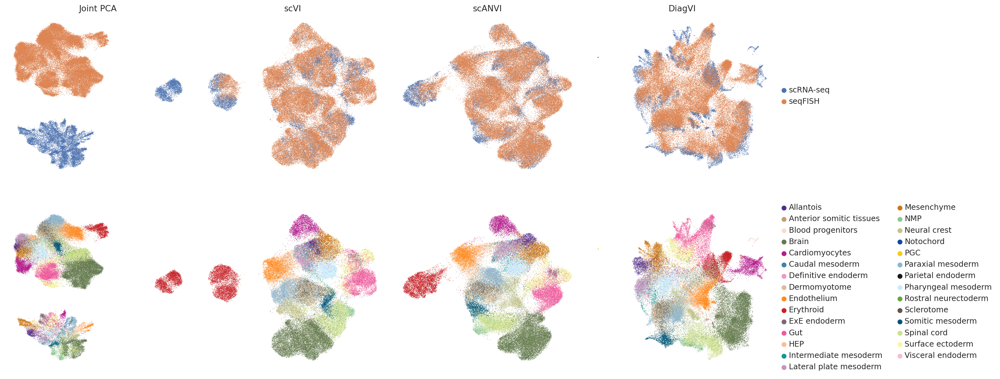

In [48]:
combined_sub.uns["celltype_harmonized_colors"] = [
    color_lookup[c] for c in combined_sub.obs["celltype_harmonized"].cat.categories
]

colors = ["modality", "celltype_harmonized"]
n_methods = len(embedding_keys)
n_colors = len(colors)

fig, axes = plt.subplots(n_colors, n_methods, figsize=(5 * n_methods, 4 * n_colors))
method_names = list(embedding_keys.keys())

for col, (method_name, (_, umap_key)) in enumerate(embedding_keys.items()):
    for row, color in enumerate(colors):
        ax = axes[row, col]

        legend_loc = "right margin" if col == n_methods - 1 else None

        sc.pl.embedding(
            combined_sub,
            basis=umap_key,
            color=color,
            ax=ax,
            show=False,
            title=method_name if row == 0 else "",
            legend_loc=legend_loc,
        )

plt.tight_layout()
plt.show()

In [49]:
combined_sub.obs_names_make_unique()
combined_sub_sub = cytovi.subsample(combined_sub, n_obs=10000, groupby="modality")

In [50]:
# Run scib-metrics benchmark on subset
bm_sub = Benchmarker(
    combined_sub_sub,
    batch_key="batch",
    label_key="celltype_harmonized",
    embedding_obsm_keys=[PCA_LATENT_KEY, DIAGVI_LATENT_KEY, SCVI_LATENT_KEY, SCANVI_LATENT_KEY],
    progress_bar=False,
    n_jobs=-1,
)
bm_sub.benchmark()

2026-06-18 15:10:04 | [INFO] isolated labels: no more than 2 batches per label


INFO     PGC consists of a single batch or is too small. Skip.                                                     
INFO     Rostral neurectoderm consists of a single batch or is too small. Skip.                                    
INFO     Visceral endoderm consists of a single batch or is too small. Skip.                                       


2026-06-18 15:19:04 | [INFO] isolated labels: no more than 2 batches per label


INFO     PGC consists of a single batch or is too small. Skip.                                                     
INFO     Rostral neurectoderm consists of a single batch or is too small. Skip.                                    
INFO     Visceral endoderm consists of a single batch or is too small. Skip.                                       


2026-06-18 15:19:23 | [INFO] isolated labels: no more than 2 batches per label


INFO     PGC consists of a single batch or is too small. Skip.                                                     
INFO     Rostral neurectoderm consists of a single batch or is too small. Skip.                                    
INFO     Visceral endoderm consists of a single batch or is too small. Skip.                                       


2026-06-18 15:19:39 | [INFO] isolated labels: no more than 2 batches per label


INFO     PGC consists of a single batch or is too small. Skip.                                                     
INFO     Rostral neurectoderm consists of a single batch or is too small. Skip.                                    
INFO     Visceral endoderm consists of a single batch or is too small. Skip.                                       


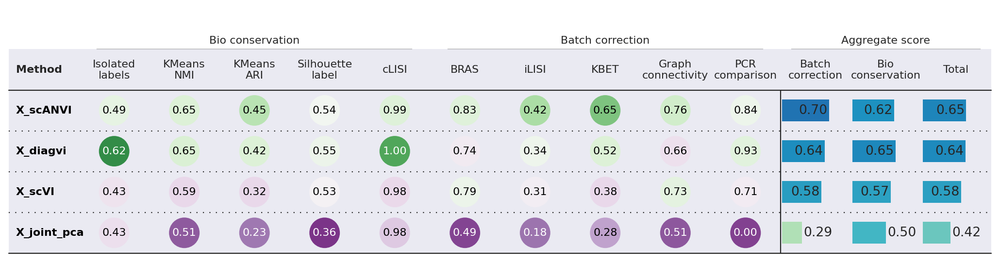

In [51]:
bm_sub.plot_results_table(min_max_scale=False)

With only 50 linked features, DiagVI outperforms scANVI - especially with respect to preserving biological variance in the data. This demonstrates DiagVI's strength in the weak-linkage regime. The guidance graph loss effectively leverages weak feature correspondences to align feature embeddings, while the unbalanced optimal transport loss aligns cell populations across modalities without requiring a lot of overlapping features.

### Save and load model

We can save the trained model for later use.

In [52]:
model_dir = os.path.join(save_dir.name, "diagvi_model")
model.save(model_dir, overwrite=True)

In [53]:
# To load the model later:
model = DIAGVI.load(model_dir, adatas=input_dict)

INFO     File /tmp/tmp3t21wled/diagvi_model/model.pt already downloaded                                            
INFO     Guidance graph consistency checks passed.                                                                 
INFO     DiagVI Model with the following params: input names: ['scRNAseq', 'seqFISH'], n_inputs: {'scRNAseq': 1780,
         'seqFISH': 351}, n_batches: {'scRNAseq': 4, 'seqFISH': 3}, n_labels: {'scRNAseq': 27, 'seqFISH': 1},      
         semi_supervised: {'scRNAseq': True, 'seqFISH': False}, gmm_priors: {'scRNAseq': True, 'seqFISH': True},   
         generative distributions: {'scRNAseq': 'nb', 'seqFISH': 'nb'}, n_latent: 50.                              
